In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from matplotlib.image import imread
from IPython import display
import numpy as np
from PIL import Image, ImageDraw
import glob
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
#tf.compat.v1.disable_eager_execution()

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 10002195245272351460
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3653779685898369040
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Enable saving to Google Drive if working with colab, to external SSD, or disable if saving locally

In [2]:
def save_to(save = "ssd"):
  if save == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones
  elif save == "ssd":
    os.chdir("D:/GanNoMask")

In [3]:
save_to("ssd")

## Batch size impact
The optimal value for batch size lies within 1 and sample size. 1 is good for the training accuracy, but bad for the variance in the generated output. At the same time, sample size is a number which would be restricted by the memory. The tested specifications suggest that the potentially better values for the batch size are 8, 10, 20.

In [4]:
BUFFER_SIZE = 2520
BATCH_SIZE = 1
IMG_WIDTH = 512
IMG_HEIGHT = 512
#OUTPUT_CHANNELS = 3
EPOCHS = 10000

## Define the Generator. Plot the Generator training pipeline diagram.
Generator uses two inputs: 1-channel random noise vector and vector of x&y coordinates. Then the layers are concatenated. The resulted 3-channel layer is a subject to downsampling, with a following forwarding of the downsampled layer to a skip connection. After the input is fully downsampled, the upsampling begins, with the concatenation of the layers forwarded respectively with skip connection.

In [5]:
def random_noise(batch_size, img_width, img_height, channels):
    noise_vector = tf.random.uniform([batch_size, img_width, img_height, channels])
    return noise_vector

In [6]:
#z = tf.zeros([BATCH_SIZE, 512, 512, 1])
noise = random_noise(BATCH_SIZE, 251, 251, 2)

In [7]:
from scipy import special

def circularLowpassKernel(omega_c, N):  # omega = cutoff frequency in radians (pi is max), N = horizontal size of the kernel, also its vertical size, must be odd.
  kernel = np.fromfunction(lambda x, y: omega_c*special.j1(omega_c*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2))/(2*np.pi*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2)), [N, N])
  kernel[(N - 1)//2, (N - 1)//2] = omega_c**2/(4*np.pi)
  return kernel

 

def rotatedCosineWindow(N):  # N = horizontal size of the targeted kernel, also its vertical size, must be odd.
  return np.fromfunction(lambda y, x: np.maximum(np.cos(np.pi/2*np.sqrt(((x - (N - 1)/2)/((N - 1)/2 + 1))**2 + ((y - (N - 1)/2)/((N - 1)/2 + 1))**2)), 0), [N, N])

 

kernelN = 9  # Horizontal size of the kernel, also its vertical size. Must be odd.
omega_c = np.pi/2  # Cutoff frequency in radians <= pi
kernel = circularLowpassKernel(omega_c, kernelN)
window = rotatedCosineWindow(kernelN)
windowedkernel = kernel*window
windowedkernel /= np.sqrt(np.sum(windowedkernel**2, axis=(0, 1))) # Normalize to sumsq = 1
windowedkernel = windowedkernel.astype(np.float32)
print(windowedkernel.shape[0])

9


C:\ProgramData\Miniconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [8]:
kernel_cutoff_pi = circularLowpassKernel(np.pi, kernelN)
windowedkernel_cutoff_pi = kernel_cutoff_pi*window
windowedkernel_cutoff_pi /= np.sqrt(np.sum(windowedkernel_cutoff_pi**2, axis=(0, 1))) # Normalize to sumsq = 1
windowedkernel_cutoff_pi = windowedkernel_cutoff_pi.astype(np.float32)

C:\ProgramData\Miniconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [9]:
windowedkernel

array([[ 0.0000000e+00,  1.6675142e-18,  6.5842556e-05, -6.8229926e-03,
        -1.0574882e-02, -6.8229926e-03,  6.5842556e-05,  1.6675142e-18,
         0.0000000e+00],
       [ 1.6675142e-18, -3.7948552e-03, -2.4887333e-02, -3.6012352e-02,
        -3.5567533e-02, -3.6012352e-02, -2.4887333e-02, -3.7948552e-03,
         1.6675142e-18],
       [ 6.5842556e-05, -2.4887333e-02, -3.0924233e-02,  2.9077459e-02,
         7.4202806e-02,  2.9077459e-02, -3.0924233e-02, -2.4887333e-02,
         6.5842556e-05],
       [-6.8229926e-03, -3.6012352e-02,  2.9077459e-02,  2.2748590e-01,
         3.4744734e-01,  2.2748590e-01,  2.9077459e-02, -3.6012352e-02,
        -6.8229926e-03],
       [-1.0574882e-02, -3.5567533e-02,  7.4202806e-02,  3.4744734e-01,
         5.0620246e-01,  3.4744734e-01,  7.4202806e-02, -3.5567533e-02,
        -1.0574882e-02],
       [-6.8229926e-03, -3.6012352e-02,  2.9077459e-02,  2.2748590e-01,
         3.4744734e-01,  2.2748590e-01,  2.9077459e-02, -3.6012352e-02,
        -6.

In [10]:
np.shape(noise)

TensorShape([1, 251, 251, 2])

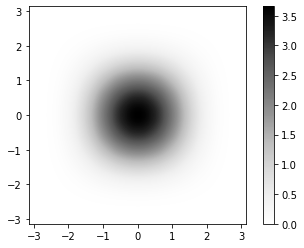

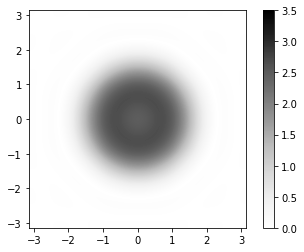

In [11]:
oldkernel = np.array([[1, 4, 6, 4, 1], [4, 16, 24, 16, 4], [6, 24, 36, 24, 6], [4, 16, 24, 16, 4], [1, 4, 6, 4, 1]], dtype=float)
oldkernel /= np.sqrt(np.sum(oldkernel**2, axis=(0, 1))) # Normalize to sumsq = 1
 
absF = np.abs(np.fft.fftshift(np.fft.fft2(np.pad(oldkernel, 100, mode = 'constant', constant_values = 0))))
 
plt.imshow(absF, vmin=0, vmax=np.max(absF), cmap='Greys', extent=[-np.pi, np.pi, -np.pi, np.pi])
plt.colorbar()
plt.show()
 
absF = np.abs(np.fft.fftshift(np.fft.fft2(np.pad(windowedkernel, 100, mode = 'constant', constant_values = 0))))
 
plt.imshow(absF, vmin=0, vmax=3.5, cmap='Greys', extent=[-np.pi, np.pi, -np.pi, np.pi])
plt.colorbar()
plt.show()

In [12]:
z = tf.constant(0, shape=(BATCH_SIZE, 1))   #np.random.randint(1, size=(BATCH_SIZE, 1))

In [13]:
kernel_shape = windowedkernel_cutoff_pi.shape[0]

In [14]:
def downsample1(apply_batchnorm=True):
  initializer = tf.keras.initializers.RandomUniform(-1, 1)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(2, 
                                    4, 
                                    strides=1, 
                                    padding='valid', 
                                    kernel_initializer=initializer, 
                                    use_bias=True))
                                    #kernel_regularizer=tf.keras.regularizers.l2(5e-2)))
  
  return result

In [15]:
def downsample234(apply_batchnorm=True):
  initializer = tf.keras.initializers.Zeros()
  result = tf.keras.Sequential()
  antial1 = tf.keras.layers.DepthwiseConv2D(windowedkernel_cutoff_pi.shape[0], 
                                           strides=1, 
                                           padding='valid', 
                                           depthwise_initializer=initializer, 
                                           use_bias=False)
  
  result.add(antial1)
  antial1.trainable = False
  
  result.add(tf.keras.layers.LeakyReLU())
  
  antial2 = tf.keras.layers.DepthwiseConv2D(windowedkernel_cutoff_pi.shape[0], 
                                           strides=2, 
                                           padding='valid', 
                                           depthwise_initializer=initializer, 
                                           use_bias=False)
  
  result.add(antial2)
  antial2.trainable = False
   
  return result

In [16]:
def Model():
  
  z = tf.keras.Input(shape = (1, ), name = "input")
  
  x = z

  x = tf.keras.layers.Embedding(1, 512 * 512, input_length = 1, input_shape = (1, ), name = "embed")(x)
  
  x = tf.keras.layers.LayerNormalization()(x)
  
  x = tf.keras.layers.Reshape((512, 512, 1), name='reshape')(x)
  
  x = tf.nn.depthwise_conv2d(x, windowedkernel_cutoff_pi.reshape(
    (windowedkernel_cutoff_pi.shape[0], windowedkernel_cutoff_pi.shape[1], 1, 1)), [1, 1, 1, 1], padding = "VALID")
  
  downstack = [downsample1(False),
               downsample234(False)] 
               #downsample5(False)]
  
  for down in downstack:
    x = down(x)
    if np.shape(down.layers)[0] > 1:
      reps = tf.shape(down.layers[0].get_weights())[3]
      new_w = tf.repeat(tf.constant([[windowedkernel]]), reps, axis = 3)
      new_w = tf.reshape(new_w, [windowedkernel.shape[0], windowedkernel.shape[1], reps, 1])
      down.layers[0].set_weights([new_w])
      
      reps = tf.shape(down.layers[-1].get_weights())[3]
      new_w = tf.repeat(tf.constant([[windowedkernel]]), reps, axis = 3)
      new_w = tf.reshape(new_w, [windowedkernel.shape[0], windowedkernel.shape[1], reps, 1])
      down.layers[-1].set_weights([new_w])
  
  return tf.keras.Model(inputs=z, outputs=x)

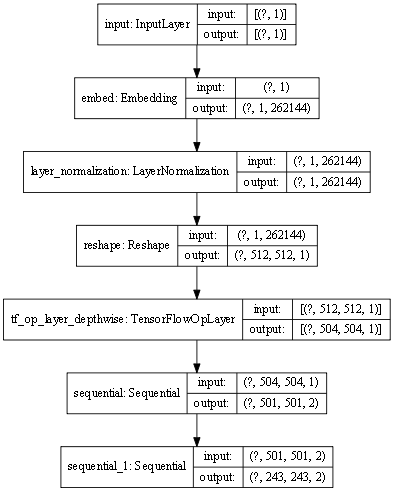

In [17]:
tf.keras.backend.clear_session()
model = Model()
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

In [18]:
def reshape(noise, kernel):
  reps = np.shape(noise)[-1]
  channeled_kernel = np.repeat(kernel, reps)
  channeled_kernel = channeled_kernel.reshape((kernel.shape[0], kernel.shape[1], reps, 1))
  return channeled_kernel

In [19]:
reshaped_kernel = reshape(noise, windowedkernel_cutoff_pi)

In [20]:
def filter_noise(noise, kernel):
  noise = tf.nn.depthwise_conv2d(noise, kernel, [1, 1, 1, 1], padding = "VALID")
  return noise

In [21]:
white = filter_noise(noise, reshaped_kernel)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


-1.9043748
6.6075363


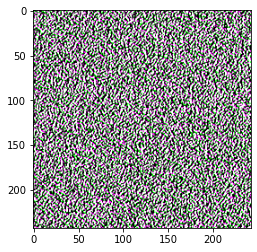

In [22]:
gen_output = (model(z, training=False)-0.5)*0.45+0.5
print(np.min(gen_output))
print(np.max(gen_output))
plt.imshow(tf.stack([gen_output[0, ..., 0], gen_output[0, ..., 1], gen_output[0, ..., 0]], axis = -1))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


-0.23819663
1.4254004


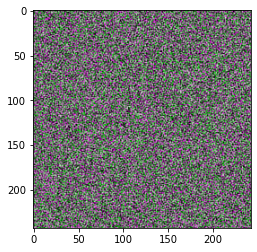

In [23]:
print(np.min(white))
print(np.max(white))
white_view = white/1.4
plt.imshow(tf.stack([white_view[0, ..., 0], white_view[0, ..., 1], white_view[0, ..., 0]], axis = -1))

## Define the Generator loss

In [24]:
def model_loss(gen_output, white):

  l2_loss = tf.reduce_mean((white - gen_output)**2)

  return l2_loss

In [25]:
model_loss(gen_output, white)

<tf.Tensor: shape=(), dtype=float32, numpy=0.94390005>

In [26]:
def bloating_weights1(model):
  weights = tf.reduce_mean(model.layers[1].get_weights()[0]**2)
  return weights

In [27]:
def bloating_weights2(model):
  weights = tf.reduce_mean(model.layers[-1].layers[0].get_weights()[0]**2)
  return weights

## Create Adam Generator and Discriminator optimizers
Parameters are used from the pix2pix.

In [28]:
def select_optimizer():
  optimizer = tf.keras.optimizers.Adam(1e-2, beta_1 = 0.5, epsilon = 0.01)
  return optimizer

In [29]:
optimizer = select_optimizer()

## Create checkpoint and logs savers for later inspection of the predictions and losses
By default, the checkpoint is saved once every 30 epochs.

In [30]:
checkpoint_dir = './training_checkpoints_multi2'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.save(file_prefix=checkpoint_prefix)

'./training_checkpoints_multi2\\ckpt-1'

In [31]:
def checkpoint_save(epoch, inEpochs = 30):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

In [32]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## Define the image generation function. Plot the concatenated random noise and coordinates vectors image, the target image and the model's prediction image. 

In [33]:
def generate_images(model, z, white, save = False, epoch = 0):
  prediction = model(z[tf.newaxis, ...], training=False)
  plt.figure(figsize=(15, 15))
  first = tf.stack([prediction[0, ..., 0], prediction[0, ..., 1], prediction[0, ..., 0]], axis = -1)
  second = tf.stack([white[..., 0], white[..., 1], white[..., 0]], axis = -1)
  display_list = [first, second]
  title = ['Predicted Image', 'White']
  
  if save:
    if (epoch + 1) % 5 == 0:
      name = str(epoch).zfill(4)
    #tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), display_list[2])
      tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), first)

  for i in range(2):
    #plt.figure(figsize=(12, 12))
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    #plt.imshow((display_list[i] - 0.5) * 100 + 0.5)
    plt.axis('off')
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


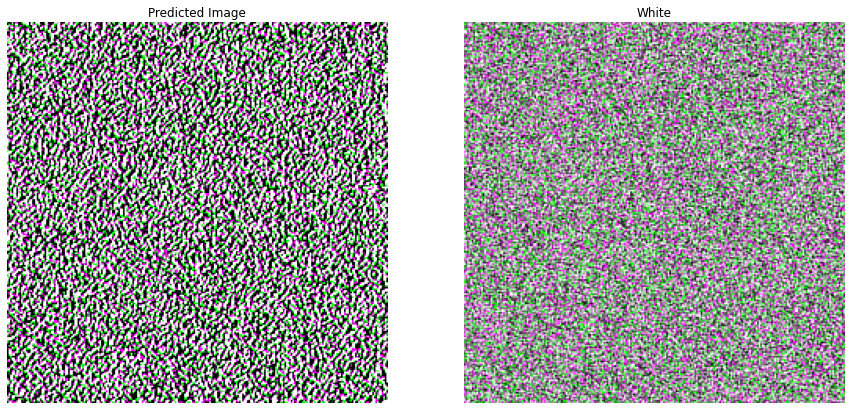

In [34]:
generate_images(model, z[0], white[0], save = False)

## Define the train step
Save losses to tensorboard.

In [35]:
@tf.function
def train_step(z, white, epoch):
  with tf.GradientTape() as tape:
    gen_output = model(z, training=True)

    loss = model_loss(gen_output, white)
    
    #weights1 = bloating_weights1(model)
    #weights2 = bloating_weights2(model)
    
  gradients = tape.gradient(loss,
                            model.trainable_variables)
    
  
  optimizer.apply_gradients(zip(gradients,
                                model.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('model_loss', loss, step=epoch)
    #tf.summary.scalar('bloating_weights1', weights1, step=epoch)
    #tf.summary.scalar('bloating_weights2', weights2, step=epoch)

## Define the fit function
Show one prediction for the random image per epoch. Create basic interface (the interface might not work well if using tensorflow.2). Create checkpoints with the default interval and save the last epoch as well. 

In [36]:
def fit(epochs):
  for epoch in range(epochs):
    start = time.time()
    
    display.clear_output(wait=True)
    generate_images(model, z[0], white[0], save = True)
    
    print(model_loss(model(z), white))
    print(np.mean(model.layers[1].get_weights()[0]**2))
    print(np.mean(model.layers[-1].layers[0].get_weights()[0]**2))

    print("Epoch: ", epoch)
    
    # Train
    somevar = 0
    train_step(z, white, epoch)
    if epoch % 50 == 0 or epoch == 999:
      name = str(somevar).zfill(4)
      direct = str(epoch).zfill(4)
      try:
        os.mkdir("test/" + direct)
      except:
        pass

      somevar += 1
    print()

    checkpoint_save(epoch, 30)
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    
  checkpoint.save(file_prefix=checkpoint_prefix)

## Initiate tensorboard to view the losses from the runs

In [37]:
%load_ext tensorboard

In [39]:
%tensorboard --logdir {log_dir} --host localhost --port 6276

Reusing TensorBoard on port 6276 (pid 12056), started 0:02:01 ago. (Use '!kill 12056' to kill it.)

## Fit the model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


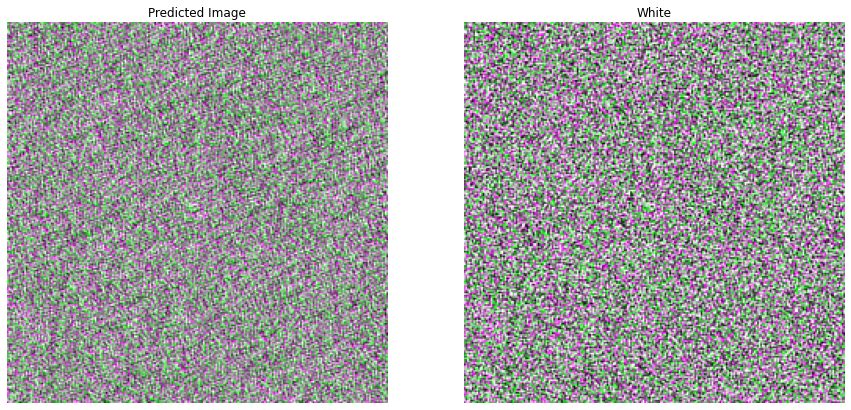

tf.Tensor(0.03274869, shape=(), dtype=float32)
0.00077057217
0.012345679
Epoch:  3447


In [ ]:
fit(EPOCHS)

In [39]:
def load_ckpt(latest = True, number = 1):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints_multi3/ckpt-' + str(number))

In [40]:
load_ckpt(False, 120)